In [1]:
from aav_lipid_cluster import *
from aav_aavr_interaction import *
import numpy as np
import matplotlib.pyplot as plt

/Users/pp420/miniconda3/envs/mdanalysis/lib/python3.11/site-packages/MDAnalysis/topology/TPRParser.py:161: DeprecationWarning: 'xdrlib' is deprecated and slated for removal in Python 3.13
  import xdrlib


# Analyse AAV2-AAVR Repeat 1 only the binding poses of interest first.

In [2]:
import MDAnalysis as mda
u = mda.Universe('/Users/pp420/mres_aav_aavr_project/aav2_aavr_scaled_3/dir_v2r1/v2r1_nosolv.gro', 
                 '/Users/pp420/mres_aav_aavr_project/aav2_aavr_scaled_3/dir_v2r1/v2r1_nosolv.xtc')
# capsid and aavr 3
capsid_bb = assemble_timeseries_array(u=u, selection="name BB and resid 1:31020")
aavr_3_bb = assemble_timeseries_array(u=u, selection="name BB and resid 32333:32988")

/Users/pp420/miniconda3/envs/mdanalysis/lib/python3.11/site-packages/MDAnalysis/topology/guessers.py:146: UserWarning: Failed to guess the mass for the following atom types: A
  warnings.warn("Failed to guess the mass for the following atom types: {}".format(atom_type))
/Users/pp420/miniconda3/envs/mdanalysis/lib/python3.11/site-packages/MDAnalysis/topology/guessers.py:146: UserWarning: Failed to guess the mass for the following atom types: D
  warnings.warn("Failed to guess the mass for the following atom types: {}".format(atom_type))
/Users/pp420/miniconda3/envs/mdanalysis/lib/python3.11/site-packages/MDAnalysis/topology/guessers.py:146: UserWarning: Failed to guess the mass for the following atom types: E
  warnings.warn("Failed to guess the mass for the following atom types: {}".format(atom_type))
/Users/pp420/miniconda3/envs/mdanalysis/lib/python3.11/site-packages/MDAnalysis/topology/guessers.py:146: UserWarning: Failed to guess the mass for the following atom types: G
  warnings.

In [3]:
## Binding pose 1: PKD3-4 dominant interaction
b = 900
e = 2100
step = 200 # Make sure time range is divisible by this number.
cutoff = 10 
## Compute distances
time_window_for_calc = np.arange(b,e,step)

for k in range(len(time_window_for_calc)):
    start_time = time_window_for_calc[k]
    time_of_interest = np.arange(start_time, start_time + step, 1)
    capsid_int = capsid_bb[start_time:start_time+step] ## Don't forget to reload the capsid. By redefining variable, this saves memory.
    aavr_3_int = aavr_3_bb[start_time:start_time+step]
    binding_event = np.empty((len(time_of_interest),len(capsid_int[0]),len(aavr_3_int[0])), dtype=np.float32)

    for i in range(len(time_of_interest)):
        mat = numba_cdist(residues_1=capsid_int[i],residues_2=aavr_3_int[i])
        binding_event[i] += mat

    binding_event_contacts = binding_event < cutoff
    binding_event_contacts_avg = binding_event_contacts.sum(axis=0) / len(binding_event)
    binding_event_capsid_occupancy = binding_event_contacts.sum(axis=2) > 0 
    binding_event_capsid_occupancy  = binding_event_capsid_occupancy.sum(axis=0) / len(binding_event)
    binding_event_aavr_occupancy = binding_event_contacts.sum(axis=1) > 0 
    binding_event_aavr_occupancy  = binding_event_aavr_occupancy.sum(axis=0) / len(binding_event)
    np.save(f"fig6/v2r1_contact_{b}_{e}_start{start_time}.npy", binding_event_contacts_avg)
    np.save(f"fig6/v2r1_capsid_occupancy_{b}_{e}_start{start_time}.npy", binding_event_capsid_occupancy)
    np.save(f"fig6/v2r1_aavr_occupancy_{b}_{e}_start{start_time}.npy", binding_event_aavr_occupancy)
    del capsid_int
    del aavr_3_int
    del binding_event
    del binding_event_contacts_avg
    del binding_event_contacts
    del binding_event_capsid_occupancy
    del binding_event_aavr_occupancy

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [4]:
## Binding pose 2: PKD1-2 dominant interaction
b = 4000
e = 4200
step = 200 # Make sure time range is divisible by this number.
cutoff = 10 
## Compute distances
time_window_for_calc = np.arange(b,e,step)

for k in range(len(time_window_for_calc)):
    start_time = time_window_for_calc[k]
    time_of_interest = np.arange(start_time, start_time + step, 1)
    capsid_int = capsid_bb[start_time:start_time+step] ## Don't forget to reload the capsid. By redefining variable, this saves memory.
    aavr_3_int = aavr_3_bb[start_time:start_time+step]
    binding_event = np.empty((len(time_of_interest),len(capsid_int[0]),len(aavr_3_int[0])), dtype=np.float32)

    for i in range(len(time_of_interest)):
        mat = numba_cdist(residues_1=capsid_int[i],residues_2=aavr_3_int[i])
        binding_event[i] += mat

    binding_event_contacts = binding_event < cutoff
    binding_event_contacts_avg = binding_event_contacts.sum(axis=0) / len(binding_event)
    binding_event_capsid_occupancy = binding_event_contacts.sum(axis=2) > 0 
    binding_event_capsid_occupancy  = binding_event_capsid_occupancy.sum(axis=0) / len(binding_event)
    binding_event_aavr_occupancy = binding_event_contacts.sum(axis=1) > 0 
    binding_event_aavr_occupancy  = binding_event_aavr_occupancy.sum(axis=0) / len(binding_event)
    np.save(f"fig6/v2r1_contact_{b}_{e}_start{start_time}.npy", binding_event_contacts_avg)
    np.save(f"fig6/v2r1_capsid_occupancy_{b}_{e}_start{start_time}.npy", binding_event_capsid_occupancy)
    np.save(f"fig6/v2r1_aavr_occupancy_{b}_{e}_start{start_time}.npy", binding_event_aavr_occupancy)
    del capsid_int
    del aavr_3_int
    del binding_event
    del binding_event_contacts_avg
    del binding_event_contacts
    del binding_event_capsid_occupancy
    del binding_event_aavr_occupancy

# AAV2 Solution System Repeat 1

In [164]:
import MDAnalysis as mda
u = mda.Universe('/Users/pp420/mres_aav_aavr_project/aav2r_sol_scaled_2/dir_v2s1/v2s1_nosolv_centered.gro', 
                 '/Users/pp420/mres_aav_aavr_project/aav2r_sol_scaled_2/dir_v2s1/v2s1_nosolv_centered.xtc')
# capsid and aavr 3
capsid_bb = assemble_timeseries_array(u=u, selection="name BB and resid 1:31020")
aavr_2_bb = assemble_timeseries_array(u=u, selection="name BB and resid 31503:31984")

In [180]:
## Binding pose 2: PKD1-2 dominant interaction
b = 300
e = 1500
step = 200 # Make sure time range is divisible by this number.
cutoff = 10 
## Compute distances
time_window_for_calc = np.arange(b,e,step)
sim_system = "v2s1"

for k in range(len(time_window_for_calc)):
    start_time = time_window_for_calc[k]
    time_of_interest = np.arange(start_time, start_time + step, 1)
    capsid_int = capsid_bb[start_time:start_time+step] ## Don't forget to reload the capsid. By redefining variable, this saves memory.
    aavr_2_int = aavr_2_bb[start_time:start_time+step]
    binding_event = np.empty((len(time_of_interest),len(capsid_int[0]),len(aavr_2_int[0])), dtype=np.float32)

    for i in range(len(time_of_interest)):
        mat = numba_cdist(residues_1=capsid_int[i],residues_2=aavr_2_int[i])
        binding_event[i] += mat

    binding_event_contacts = binding_event < cutoff
    binding_event_contacts_avg = binding_event_contacts.sum(axis=0) / len(binding_event)
    binding_event_capsid_occupancy = binding_event_contacts.sum(axis=2) > 0 
    binding_event_capsid_occupancy  = binding_event_capsid_occupancy.sum(axis=0) / len(binding_event)
    binding_event_aavr_occupancy = binding_event_contacts.sum(axis=1) > 0 
    binding_event_aavr_occupancy  = binding_event_aavr_occupancy.sum(axis=0) / len(binding_event)
    np.save(f"fig6/{sim_system}_contact_{b}_{e}_start{start_time}.npy", binding_event_contacts_avg)
    np.save(f"fig6/{sim_system}_capsid_occupancy_{b}_{e}_start{start_time}.npy", binding_event_capsid_occupancy)
    np.save(f"fig6/{sim_system}_aavr_occupancy_{b}_{e}_start{start_time}.npy", binding_event_aavr_occupancy)
    del capsid_int
    del aavr_2_int
    del binding_event
    del binding_event_contacts_avg
    del binding_event_contacts
    del binding_event_capsid_occupancy
    del binding_event_aavr_occupancy

In [166]:
## Binding pose 2: PKD1-2 dominant interaction
b = 5000
e = 5200
step = 200 # Make sure time range is divisible by this number.
cutoff = 10 
## Compute distances
time_window_for_calc = np.arange(b,e,step)
sim_system = "v2s1"

for k in range(len(time_window_for_calc)):
    start_time = time_window_for_calc[k]
    time_of_interest = np.arange(start_time, start_time + step, 1)
    capsid_int = capsid_bb[start_time:start_time+step] ## Don't forget to reload the capsid. By redefining variable, this saves memory.
    aavr_2_int = aavr_2_bb[start_time:start_time+step]
    binding_event = np.empty((len(time_of_interest),len(capsid_int[0]),len(aavr_2_int[0])), dtype=np.float32)

    for i in range(len(time_of_interest)):
        mat = numba_cdist(residues_1=capsid_int[i],residues_2=aavr_2_int[i])
        binding_event[i] += mat

    binding_event_contacts = binding_event < cutoff
    binding_event_contacts_avg = binding_event_contacts.sum(axis=0) / len(binding_event)
    binding_event_capsid_occupancy = binding_event_contacts.sum(axis=2) > 0 
    binding_event_capsid_occupancy  = binding_event_capsid_occupancy.sum(axis=0) / len(binding_event)
    binding_event_aavr_occupancy = binding_event_contacts.sum(axis=1) > 0 
    binding_event_aavr_occupancy  = binding_event_aavr_occupancy.sum(axis=0) / len(binding_event)
    np.save(f"fig6/{sim_system}_contact_{b}_{e}_start{start_time}.npy", binding_event_contacts_avg)
    np.save(f"fig6/{sim_system}_capsid_occupancy_{b}_{e}_start{start_time}.npy", binding_event_capsid_occupancy)
    np.save(f"fig6/{sim_system}_aavr_occupancy_{b}_{e}_start{start_time}.npy", binding_event_aavr_occupancy)
    del capsid_int
    del aavr_2_int
    del binding_event
    del binding_event_contacts_avg
    del binding_event_contacts
    del binding_event_capsid_occupancy
    del binding_event_aavr_occupancy

# Load Data

In [182]:
v2r1_contact_900 = np.load("fig6/v2r1_contact_900_2100_start900.npy")
v2r1_contact_1100 = np.load("fig6/v2r1_contact_900_2100_start1100.npy")
v2r1_contact_1300 = np.load("fig6/v2r1_contact_900_2100_start1300.npy")
v2r1_contact_1500 = np.load("fig6/v2r1_contact_900_2100_start1500.npy")
v2r1_contact_1700 = np.load("fig6/v2r1_contact_900_2100_start1700.npy")
v2r1_contact_2100 = np.load("fig6/v2r1_contact_900_2100_start1900.npy")
v2r1_capsid_900  = np.load("fig6/v2r1_capsid_occupancy_900_2100_start900.npy")
v2r1_capsid_1100 = np.load("fig6/v2r1_capsid_occupancy_900_2100_start1100.npy")
v2r1_capsid_1300 = np.load("fig6/v2r1_capsid_occupancy_900_2100_start1300.npy")
v2r1_capsid_1500 = np.load("fig6/v2r1_capsid_occupancy_900_2100_start1500.npy")
v2r1_capsid_1700 = np.load("fig6/v2r1_capsid_occupancy_900_2100_start1700.npy")
v2r1_capsid_2100 = np.load("fig6/v2r1_capsid_occupancy_900_2100_start1900.npy")
v2r1_aavr_900  = np.load("fig6/v2r1_aavr_occupancy_900_2100_start900.npy")
v2r1_aavr_1100 = np.load("fig6/v2r1_aavr_occupancy_900_2100_start1100.npy")
v2r1_aavr_1300 = np.load("fig6/v2r1_aavr_occupancy_900_2100_start1300.npy")
v2r1_aavr_1500 = np.load("fig6/v2r1_aavr_occupancy_900_2100_start1500.npy")
v2r1_aavr_1700 = np.load("fig6/v2r1_aavr_occupancy_900_2100_start1700.npy")
v2r1_aavr_2100 = np.load("fig6/v2r1_aavr_occupancy_900_2100_start1900.npy")
v2r1_contact_4000 = np.load("fig6/v2r1_contact_4000_4200_start4000.npy")
v2r1_capsid_4000  = np.load("fig6/v2r1_capsid_occupancy_4000_4200_start4000.npy")
v2r1_aavr_4000  = np.load("fig6/v2r1_aavr_occupancy_4000_4200_start4000.npy")
v2s1_contact_5000 = np.load("fig6/v2s1_contact_5000_5200_start5000.npy")
v2s1_capsid_5000 = np.load("fig6/v2s1_capsid_occupancy_5000_5200_start5000.npy")
v2s1_aavr_5000 = np.load("fig6/v2s1_aavr_occupancy_5000_5200_start5000.npy")
v2s1_contact_300 =  np.load("fig6/v2s1_contact_300_1500_start300.npy")
v2s1_contact_500 =  np.load("fig6/v2s1_contact_300_1500_start500.npy")
v2s1_contact_700 =  np.load("fig6/v2s1_contact_300_1500_start700.npy")
v2s1_contact_900 =  np.load("fig6/v2s1_contact_300_1500_start900.npy")
v2s1_contact_1100 = np.load("fig6/v2s1_contact_300_1500_start1100.npy")
v2s1_contact_1300 = np.load("fig6/v2s1_contact_300_1500_start1300.npy")
v2s1_capsid_300 =  np.load("fig6/v2s1_capsid_occupancy_300_1500_start300.npy")
v2s1_capsid_500 =  np.load("fig6/v2s1_capsid_occupancy_300_1500_start500.npy")
v2s1_capsid_700 =  np.load("fig6/v2s1_capsid_occupancy_300_1500_start700.npy")
v2s1_capsid_900 =  np.load("fig6/v2s1_capsid_occupancy_300_1500_start900.npy")
v2s1_capsid_1100 = np.load("fig6/v2s1_capsid_occupancy_300_1500_start1100.npy")
v2s1_capsid_1300 = np.load("fig6/v2s1_capsid_occupancy_300_1500_start1300.npy")
v2s1_aavr_300 =  np.load("fig6/v2s1_aavr_occupancy_300_1500_start300.npy")
v2s1_aavr_500 =  np.load("fig6/v2s1_aavr_occupancy_300_1500_start500.npy")
v2s1_aavr_700 =  np.load("fig6/v2s1_aavr_occupancy_300_1500_start700.npy")
v2s1_aavr_900 =  np.load("fig6/v2s1_aavr_occupancy_300_1500_start900.npy")
v2s1_aavr_1100 = np.load("fig6/v2s1_aavr_occupancy_300_1500_start1100.npy")
v2s1_aavr_1300 = np.load("fig6/v2s1_aavr_occupancy_300_1500_start1300.npy")

dlist = [
v2r1_contact_900 ,
v2r1_contact_1100,
v2r1_contact_1300,
v2r1_contact_1500,
v2r1_contact_1700,
v2r1_contact_2100,
v2r1_capsid_900  ,
v2r1_capsid_1100 ,
v2r1_capsid_1300 ,
v2r1_capsid_1500 ,
v2r1_capsid_1700 ,
v2r1_capsid_2100 ,
v2r1_aavr_900   ,
v2r1_aavr_1100  ,
v2r1_aavr_1300  ,
v2r1_aavr_1500  ,
v2r1_aavr_1700  ,
v2r1_aavr_2100  ,
v2r1_contact_4000,
v2r1_capsid_4000 ,
v2r1_aavr_4000,
v2s1_contact_5000,
v2s1_capsid_5000,
v2s1_aavr_5000,
v2s1_contact_300, 
v2s1_contact_500, 
v2s1_contact_700, 
v2s1_contact_900, 
v2s1_contact_1100,
v2s1_contact_1300,
v2s1_capsid_300, 
v2s1_capsid_500, 
v2s1_capsid_700, 
v2s1_capsid_900, 
v2s1_capsid_1100,
v2s1_capsid_1300,
v2s1_aavr_300, 
v2s1_aavr_500, 
v2s1_aavr_700, 
v2s1_aavr_900, 
v2s1_aavr_1100,
v2s1_aavr_1300,
]
dlist_names = [
"AAV2-AAVR Repeat 1\n 0.9-1.1 $\mu$s\n Contact map",
"AAV2-AAVR Repeat 1\n 1.1-1.3 $\mu$s\n Contact map",
"AAV2-AAVR Repeat 1\n 1.3-1.5 $\mu$s\n Contact map",
"AAV2-AAVR Repeat 1\n 1.5-1.7 $\mu$s\n Contact map",
"AAV2-AAVR Repeat 1\n 1.7-1.9 $\mu$s\n Contact map",
"AAV2-AAVR Repeat 1\n 1.9-2.1 $\mu$s\n Contact map",
"AAV2-AAVR Repeat 1\n 0.9-1.1 $\mu$s\n Capsid Occupancy",
"AAV2-AAVR Repeat 1\n 1.1-1.3 $\mu$s\n Capsid Occupancy",
"AAV2-AAVR Repeat 1\n 1.3-1.5 $\mu$s\n Capsid Occupancy",
"AAV2-AAVR Repeat 1\n 1.5-1.7 $\mu$s\n Capsid Occupancy",
"AAV2-AAVR Repeat 1\n 1.7-1.9 $\mu$s\n Capsid Occupancy",
"AAV2-AAVR Repeat 1\n 1.9-2.1 $\mu$s\n Capsid Occupancy",
"AAV2-AAVR Repeat 1\n 0.9-1.1 $\mu$s\n AAVR Occupancy",
"AAV2-AAVR Repeat 1\n 1.1-1.3 $\mu$s\n AAVR Occupancy",
"AAV2-AAVR Repeat 1\n 1.3-1.5 $\mu$s\n AAVR Occupancy",
"AAV2-AAVR Repeat 1\n 1.5-1.7 $\mu$s\n AAVR Occupancy",
"AAV2-AAVR Repeat 1\n 1.7-1.9 $\mu$s\n AAVR Occupancy",
"AAV2-AAVR Repeat 1\n 1.9-2.1 $\mu$s\n AAVR Occupancy",
"AAV2-AAVR Repeat 1\n 4.0-4.2 $\mu$s\n Contact map",
"AAV2-AAVR Repeat 1\n 4.0-4.2 $\mu$s\n Capsid Occupancy",
"AAV2-AAVR Repeat 1\n 4.0-4.2 $\mu$s\n AAVR Occupancy",
"AAV2-SOLN Repeat 1\n 5.0-5.2 $\mu$s\n Contact map",
"AAV2-SOLN Repeat 1\n 5.0-5.2 $\mu$s\n Capsid Occupancy",
"AAV2-SOLN Repeat 1\n 5.0-5.2 $\mu$s\n AAVR Occupany",
"AAV2-SOLN Repeat 1\n 0.3-0.5 $\mu$s\n Contact map",
"AAV2-SOLN Repeat 1\n 0.5-0.7 $\mu$s\n Contact map",
"AAV2-SOLN Repeat 1\n 0.7-0.9 $\mu$s\n Contact map",
"AAV2-SOLN Repeat 1\n 0.9-1.1 $\mu$s\n Contact map",
"AAV2-SOLN Repeat 1\n 1.1-1.3 $\mu$s\n Contact map",
"AAV2-SOLN Repeat 1\n 1.3-1.5 $\mu$s\n Contact map",
"AAV2-SOLN Repeat 1\n 0.3-0.5 $\mu$s\n Capsid Occupancy",
"AAV2-SOLN Repeat 1\n 0.5-0.7 $\mu$s\n Capsid Occupancy",
"AAV2-SOLN Repeat 1\n 0.7-0.9 $\mu$s\n Capsid Occupancy",
"AAV2-SOLN Repeat 1\n 0.9-1.1 $\mu$s\n Capsid Occupancy",
"AAV2-SOLN Repeat 1\n 1.1-1.3 $\mu$s\n Capsid Occupancy",
"AAV2-SOLN Repeat 1\n 1.3-1.5 $\mu$s\n Capsid Occupancy",
"AAV2-SOLN Repeat 1\n 0.3-0.5 $\mu$s\n AAVR Occupancy",
"AAV2-SOLN Repeat 1\n 0.5-0.7 $\mu$s\n AAVR Occupancy",
"AAV2-SOLN Repeat 1\n 0.7-0.9 $\mu$s\n AAVR Occupancy",
"AAV2-SOLN Repeat 1\n 0.9-1.1 $\mu$s\n AAVR Occupancy",
"AAV2-SOLN Repeat 1\n 1.1-1.3 $\mu$s\n AAVR Occupancy",
"AAV2-SOLN Repeat 1\n 1.3-1.5 $\mu$s\n AAVR Occupancy"
]

# Plot

In [205]:
v2r1_contact_900.shape

(31020, 656)

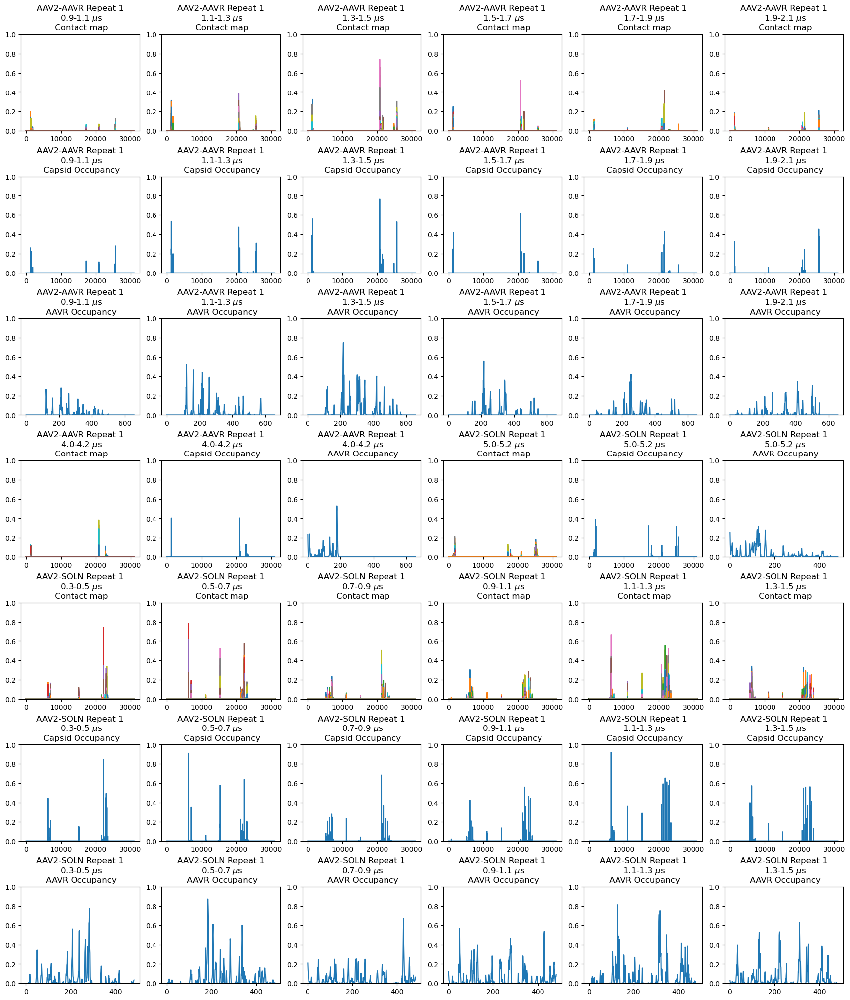

In [210]:
fig, axs = plt.subplots(7,6,figsize=(17,20),layout='constrained')
axs = axs.flat
for i in range(len(dlist)):
    to_plot = dlist[i]
    to_plot_name = dlist_names[i]
    axs[i].plot(np.arange(1,len(to_plot)+1,1), to_plot)
    axs[i].set_ylim(0,1)
    axs[i].set_title(to_plot_name)
plt.show()

In [117]:
capsid_aavr3_occupancy_avg_pose1 = np.concatenate([np.mean(dlist[6:12], axis=0).reshape(1,-1), np.mean(dlist[12:18],axis=0).reshape(1,-1)], axis=1)
capsid_aavr3_occupancy_avg_pose1 = capsid_aavr3_occupancy_avg_pose1.reshape(-1)
toBfact(capsid_lipid_contact_freq=capsid_aavr3_occupancy_avg_pose1, b=1, name="fig6/bfact/v2r1_pose1")

capsid_occupancy_avg_pose1 = np.concatenate(np.mean(dlist[6:12], axis=0).reshape(1,-1), axis=0)
capsid_occupancy_avg_pose1 = capsid_occupancy_avg_pose1.reshape(-1)
toBfact(capsid_lipid_contact_freq=capsid_occupancy_avg_pose1, b=1, name="fig6/bfact/v2r1_pose1_capsid")

aavr3_occupancy_avg_pose1 = np.concatenate(np.mean(dlist[12:18],axis=0).reshape(1,-1), axis=0)
aavr3_occupancy_avg_pose1 = aavr3_occupancy_avg_pose1.reshape(-1)
toBfact(capsid_lipid_contact_freq=aavr3_occupancy_avg_pose1, b=1, name="fig6/bfact/v2r1_pose1_aavr3")

In [149]:
## Only 1.3-1.5 us
capsid_aavr3_occupancy_avg_pose1 = np.concatenate([np.mean(dlist[8], axis=0).reshape(1,-1), np.mean(dlist[14],axis=0).reshape(1,-1)], axis=1)
capsid_aavr3_occupancy_avg_pose1 = capsid_aavr3_occupancy_avg_pose1.reshape(-1)
toBfact(capsid_lipid_contact_freq=capsid_aavr3_occupancy_avg_pose1, b=1, name="fig6/bfact/v2r1_pose1")

capsid_occupancy_avg_pose1 = dlist[8].reshape(1,-1)
capsid_occupancy_avg_pose1 = capsid_occupancy_avg_pose1.reshape(-1)
toBfact(capsid_lipid_contact_freq=capsid_occupancy_avg_pose1, b=1, name="fig6/bfact/v2r1_pose1_capsid_1300")

aavr3_occupancy_avg_pose1 = dlist[14].reshape(1,-1)
aavr3_occupancy_avg_pose1 = aavr3_occupancy_avg_pose1.reshape(-1)
toBfact(capsid_lipid_contact_freq=aavr3_occupancy_avg_pose1, b=1, name="fig6/bfact/v2r1_pose1_aavr3_1300")

In [158]:
capsid_aavr3_occupancy_avg_pose2 = np.concatenate([np.mean(dlist[-2], axis=0).reshape(1,-1), np.mean(dlist[-1],axis=0).reshape(1,-1)], axis=1)
capsid_aavr3_occupancy_avg_pose2 = capsid_aavr3_occupancy_avg_pose2.reshape(-1)
toBfact(capsid_lipid_contact_freq=capsid_aavr3_occupancy_avg_pose2, b=1, name="fig6/bfact/v2r1_pose2")

capsid_occupancy_avg_pose2 = dlist[-2]
capsid_occupancy_avg_pose2 = capsid_occupancy_avg_pose2.reshape(-1)
toBfact(capsid_lipid_contact_freq=capsid_occupancy_avg_pose2, b=1, name="fig6/bfact/v2r1_pose2_capsid")

aavr3_occupancy_avg_pose2 = dlist[-1]
aavr3_occupancy_avg_pose2 = aavr3_occupancy_avg_pose2.reshape(-1)
toBfact(capsid_lipid_contact_freq=aavr3_occupancy_avg_pose2, b=1, name="fig6/bfact/v2r1_pose2_aavr3")

In [211]:
capsid_occupancy = dlist[-11]
capsid_occupancy = capsid_occupancy.reshape(-1)
toBfact(capsid_lipid_contact_freq=capsid_occupancy, b=1, name="fig6/bfact/v2s1_capsid")

aavr3_occupancy = dlist[-5]
aavr3_occupancy = aavr3_occupancy.reshape(-1)
toBfact(capsid_lipid_contact_freq=aavr3_occupancy, b=1, name="fig6/bfact/v2s1_aavr3")

# For coloring in chimera

In [212]:
from Bio.PDB import PDBIO, PDBParser
from Bio.PDB.Chain import Chain
from Bio.PDB.Residue import Residue
import numpy as np
import xpdb

In [127]:
capsid = np.arange(1,518,1).reshape(1,-1)
for i in range(59):
    monomer = np.arange(1,518,1).reshape(1,-1)
    capsid = np.concatenate([capsid,monomer])
capsid = capsid.reshape(-1)
aavr = np.arange(1,657,1).reshape(-1)


In [134]:
## Capsid Renumbering
# to work with some non orthodox pdbs
import warnings
warnings.filterwarnings('ignore')
io = PDBIO()
import xpdb  # this is the module described below

# read
sloppyparser = PDBParser(
    PERMISSIVE=True, structure_builder=xpdb.SloppyStructureBuilder()
)

my_pdb_structure = sloppyparser.get_structure('v2r1_1600', 'fig6/str/v2r1_aavr3_1600_capsid.pdb')
print(my_pdb_structure)
# renumber residue in my_pdb_structure
for model in my_pdb_structure:
    for chain in model:
            for residue in chain:
                residue._id = (residue.id[0], capsid[residue.id[1]-1], residue.id[2])
                


# this bit just print the renumbered my_pdb_structure                    
print('\n stucture with renumbered atoms : \n___________________________________')                  
for model in my_pdb_structure:
    for chain in model:
            for residue in chain:
                print(residue, residue.id)

        
io.set_structure(my_pdb_structure)
# io.save('renumbered.pdb') 
io.save('fig6/str/v2r1_aavr3_1600_capsid_renumbered.pdb',  preserve_atom_numbering=True) 

<Structure id=v2r1_1600>

 stucture with renumbered atoms : 
___________________________________
<Residue ASP het=  resseq=1 icode= > (' ', 1, ' ')
<Residue GLY het=  resseq=2 icode= > (' ', 2, ' ')
<Residue VAL het=  resseq=3 icode= > (' ', 3, ' ')
<Residue GLY het=  resseq=4 icode= > (' ', 4, ' ')
<Residue ASN het=  resseq=5 icode= > (' ', 5, ' ')
<Residue SER het=  resseq=6 icode= > (' ', 6, ' ')
<Residue SER het=  resseq=7 icode= > (' ', 7, ' ')
<Residue GLY het=  resseq=8 icode= > (' ', 8, ' ')
<Residue ASN het=  resseq=9 icode= > (' ', 9, ' ')
<Residue TRP het=  resseq=10 icode= > (' ', 10, ' ')
<Residue HIS het=  resseq=11 icode= > (' ', 11, ' ')
<Residue CYS het=  resseq=12 icode= > (' ', 12, ' ')
<Residue ASP het=  resseq=13 icode= > (' ', 13, ' ')
<Residue SER het=  resseq=14 icode= > (' ', 14, ' ')
<Residue THR het=  resseq=15 icode= > (' ', 15, ' ')
<Residue TRP het=  resseq=16 icode= > (' ', 16, ' ')
<Residue MET het=  resseq=17 icode= > (' ', 17, ' ')
<Residue GLY het=  r

In [152]:
## Capsid Renumbering
# to work with some non orthodox pdbs
import warnings
warnings.filterwarnings('ignore')
io = PDBIO()
import xpdb  # this is the module described below

# read
sloppyparser = PDBParser(
    PERMISSIVE=True, structure_builder=xpdb.SloppyStructureBuilder()
)

my_pdb_structure = sloppyparser.get_structure('v2r1_1600', 'fig6/str/v2r1_aavr3_b1300_capsid.pdb')
print(my_pdb_structure)
# renumber residue in my_pdb_structure
for model in my_pdb_structure:
    for chain in model:
            for residue in chain:
                residue._id = (residue.id[0], capsid[residue.id[1]-1], residue.id[2])
                


# this bit just print the renumbered my_pdb_structure                    
print('\n stucture with renumbered atoms : \n___________________________________')                  
for model in my_pdb_structure:
    for chain in model:
            for residue in chain:
                print(residue, residue.id)

        
io.set_structure(my_pdb_structure)
# io.save('renumbered.pdb') 
io.save('fig6/str/v2r1_aavr3_b1300_capsid_renumbered.pdb',  preserve_atom_numbering=True) 

<Structure id=v2r1_1600>

 stucture with renumbered atoms : 
___________________________________
<Residue ASP het=  resseq=1 icode= > (' ', 1, ' ')
<Residue GLY het=  resseq=2 icode= > (' ', 2, ' ')
<Residue VAL het=  resseq=3 icode= > (' ', 3, ' ')
<Residue GLY het=  resseq=4 icode= > (' ', 4, ' ')
<Residue ASN het=  resseq=5 icode= > (' ', 5, ' ')
<Residue SER het=  resseq=6 icode= > (' ', 6, ' ')
<Residue SER het=  resseq=7 icode= > (' ', 7, ' ')
<Residue GLY het=  resseq=8 icode= > (' ', 8, ' ')
<Residue ASN het=  resseq=9 icode= > (' ', 9, ' ')
<Residue TRP het=  resseq=10 icode= > (' ', 10, ' ')
<Residue HIS het=  resseq=11 icode= > (' ', 11, ' ')
<Residue CYS het=  resseq=12 icode= > (' ', 12, ' ')
<Residue ASP het=  resseq=13 icode= > (' ', 13, ' ')
<Residue SER het=  resseq=14 icode= > (' ', 14, ' ')
<Residue THR het=  resseq=15 icode= > (' ', 15, ' ')
<Residue TRP het=  resseq=16 icode= > (' ', 16, ' ')
<Residue MET het=  resseq=17 icode= > (' ', 17, ' ')
<Residue GLY het=  r

In [155]:
## Capsid Renumbering
# to work with some non orthodox pdbs
import warnings
warnings.filterwarnings('ignore')
io = PDBIO()
import xpdb  # this is the module described below

# read
sloppyparser = PDBParser(
    PERMISSIVE=True, structure_builder=xpdb.SloppyStructureBuilder()
)

my_pdb_structure = sloppyparser.get_structure('v2r1_1600', 'fig6/str/v2r1_aavr3_b1300_aavr3.pdb')
print(my_pdb_structure)
# renumber residue in my_pdb_structure
for model in my_pdb_structure:
    for chain in model:
            for residue in chain:
                residue._id = (residue.id[0], aavr[residue.id[1]-1], residue.id[2])
                


# this bit just print the renumbered my_pdb_structure                    
print('\n stucture with renumbered atoms : \n___________________________________')                  
for model in my_pdb_structure:
    for chain in model:
            for residue in chain:
                print(residue, residue.id)

        
io.set_structure(my_pdb_structure)
# io.save('renumbered.pdb') 
io.save('fig6/str/v2r1_aavr3_b1300_aavr3_renumbered.pdb',  preserve_atom_numbering=True) 

<Structure id=v2r1_1600>

 stucture with renumbered atoms : 
___________________________________
<Residue VAL het=  resseq=1 icode= > (' ', 1, ' ')
<Residue ILE het=  resseq=2 icode= > (' ', 2, ' ')
<Residue LYS het=  resseq=3 icode= > (' ', 3, ' ')
<Residue GLU het=  resseq=4 icode= > (' ', 4, ' ')
<Residue LEU het=  resseq=5 icode= > (' ', 5, ' ')
<Residue VAL het=  resseq=6 icode= > (' ', 6, ' ')
<Residue VAL het=  resseq=7 icode= > (' ', 7, ' ')
<Residue SER het=  resseq=8 icode= > (' ', 8, ' ')
<Residue ALA het=  resseq=9 icode= > (' ', 9, ' ')
<Residue GLY het=  resseq=10 icode= > (' ', 10, ' ')
<Residue GLU het=  resseq=11 icode= > (' ', 11, ' ')
<Residue SER het=  resseq=12 icode= > (' ', 12, ' ')
<Residue VAL het=  resseq=13 icode= > (' ', 13, ' ')
<Residue GLN het=  resseq=14 icode= > (' ', 14, ' ')
<Residue ILE het=  resseq=15 icode= > (' ', 15, ' ')
<Residue THR het=  resseq=16 icode= > (' ', 16, ' ')
<Residue LEU het=  resseq=17 icode= > (' ', 17, ' ')
<Residue PRO het=  r

In [160]:
sloppyparser = PDBParser(
    PERMISSIVE=True, structure_builder=xpdb.SloppyStructureBuilder()
)
my_pdb_structure = sloppyparser.get_structure('v2r1_4100', 'fig6/str/v2r1_aavr3_b4100_capsid.pdb')
print(my_pdb_structure)
# renumber residue in my_pdb_structure
for model in my_pdb_structure:
    for chain in model:
            for residue in chain:
                residue._id = (residue.id[0], capsid[residue.id[1]-2], residue.id[2])
                


# this bit just print the renumbered my_pdb_structure                    
print('\n stucture with renumbered atoms : \n___________________________________')                  
for model in my_pdb_structure:
    for chain in model:
            for residue in chain:
                print(residue, residue.id)

        
io.set_structure(my_pdb_structure)
# io.save('renumbered.pdb') 
io.save('fig6/str/v2r1_aavr3_b4100_capsid_renumbered.pdb',  preserve_atom_numbering=True) 

<Structure id=v2r1_4100>

 stucture with renumbered atoms : 
___________________________________
<Residue ASP het=  resseq=517 icode= > (' ', 517, ' ')
<Residue GLY het=  resseq=1 icode= > (' ', 1, ' ')
<Residue VAL het=  resseq=2 icode= > (' ', 2, ' ')
<Residue GLY het=  resseq=3 icode= > (' ', 3, ' ')
<Residue ASN het=  resseq=4 icode= > (' ', 4, ' ')
<Residue SER het=  resseq=5 icode= > (' ', 5, ' ')
<Residue SER het=  resseq=6 icode= > (' ', 6, ' ')
<Residue GLY het=  resseq=7 icode= > (' ', 7, ' ')
<Residue ASN het=  resseq=8 icode= > (' ', 8, ' ')
<Residue TRP het=  resseq=9 icode= > (' ', 9, ' ')
<Residue HIS het=  resseq=10 icode= > (' ', 10, ' ')
<Residue CYS het=  resseq=11 icode= > (' ', 11, ' ')
<Residue ASP het=  resseq=12 icode= > (' ', 12, ' ')
<Residue SER het=  resseq=13 icode= > (' ', 13, ' ')
<Residue THR het=  resseq=14 icode= > (' ', 14, ' ')
<Residue TRP het=  resseq=15 icode= > (' ', 15, ' ')
<Residue MET het=  resseq=16 icode= > (' ', 16, ' ')
<Residue GLY het= 

In [161]:
## AAVR
# to work with some non orthodox pdbs
import warnings
warnings.filterwarnings('ignore')
io = PDBIO()
import xpdb  # this is the module described below

# read
sloppyparser = PDBParser(
    PERMISSIVE=True, structure_builder=xpdb.SloppyStructureBuilder()
)

my_pdb_structure = sloppyparser.get_structure('v2r1_1600', 'fig6/str/v2r1_aavr3_1600_aavr3.pdb')
print(my_pdb_structure)
# renumber residue in my_pdb_structure
for model in my_pdb_structure:
    for chain in model:
            for residue in chain:
                residue._id = (residue.id[0], aavr[residue.id[1]-1], residue.id[2])
                


# this bit just print the renumbered my_pdb_structure                    
print('\n stucture with renumbered atoms : \n___________________________________')                  
for model in my_pdb_structure:
    for chain in model:
            for residue in chain:
                print(residue, residue.id)

        
io.set_structure(my_pdb_structure)
# io.save('renumbered.pdb') 
io.save('fig6/str/v2r1_aavr3_1600_aavr3_renumbered.pdb',  preserve_atom_numbering=True) 

# read
sloppyparser = PDBParser(
    PERMISSIVE=True, structure_builder=xpdb.SloppyStructureBuilder()
)

my_pdb_structure = sloppyparser.get_structure('v2r1_4100', 'fig6/str/v2r1_aavr3_b4100_aavr3.pdb')
print(my_pdb_structure)
# renumber residue in my_pdb_structure
for model in my_pdb_structure:
    for chain in model:
            for residue in chain:
                residue._id = (residue.id[0], aavr[residue.id[1]-1], residue.id[2])
                


# this bit just print the renumbered my_pdb_structure                    
print('\n stucture with renumbered atoms : \n___________________________________')                  
for model in my_pdb_structure:
    for chain in model:
            for residue in chain:
                print(residue, residue.id)

        
io.set_structure(my_pdb_structure)
# io.save('renumbered.pdb') 
io.save('fig6/str/v2r1_aavr3_b4100_aavr3_renumbered.pdb',  preserve_atom_numbering=True) 

<Structure id=v2r1_1600>

 stucture with renumbered atoms : 
___________________________________
<Residue VAL het=  resseq=1 icode= > (' ', 1, ' ')
<Residue ILE het=  resseq=2 icode= > (' ', 2, ' ')
<Residue LYS het=  resseq=3 icode= > (' ', 3, ' ')
<Residue GLU het=  resseq=4 icode= > (' ', 4, ' ')
<Residue LEU het=  resseq=5 icode= > (' ', 5, ' ')
<Residue VAL het=  resseq=6 icode= > (' ', 6, ' ')
<Residue VAL het=  resseq=7 icode= > (' ', 7, ' ')
<Residue SER het=  resseq=8 icode= > (' ', 8, ' ')
<Residue ALA het=  resseq=9 icode= > (' ', 9, ' ')
<Residue GLY het=  resseq=10 icode= > (' ', 10, ' ')
<Residue GLU het=  resseq=11 icode= > (' ', 11, ' ')
<Residue SER het=  resseq=12 icode= > (' ', 12, ' ')
<Residue VAL het=  resseq=13 icode= > (' ', 13, ' ')
<Residue GLN het=  resseq=14 icode= > (' ', 14, ' ')
<Residue ILE het=  resseq=15 icode= > (' ', 15, ' ')
<Residue THR het=  resseq=16 icode= > (' ', 16, ' ')
<Residue LEU het=  resseq=17 icode= > (' ', 17, ' ')
<Residue PRO het=  r

In [213]:
capsid = np.arange(1,518,1).reshape(1,-1)
for i in range(59):
    monomer = np.arange(1,518,1).reshape(1,-1)
    capsid = np.concatenate([capsid,monomer])
capsid = capsid.reshape(-1)
aavr = np.arange(1,657,1).reshape(-1)

In [217]:
# V2S1
# to work with some non orthodox pdbs
import warnings
warnings.filterwarnings('ignore')
io = PDBIO()
import xpdb  # this is the module described below


capsid_path = 'fig6/str/v2s1_capsid_600.pdb'
aavr_path = 'fig6/str/v2s1_aavr_2_600.pdb'
#############################################################################
#############################################################################
#############################################################################
#############################################################################
#############################################################################
# read
sloppyparser = PDBParser(
    PERMISSIVE=True, structure_builder=xpdb.SloppyStructureBuilder()
)

my_pdb_structure = sloppyparser.get_structure('capsid', capsid_path)
print(my_pdb_structure)
# renumber residue in my_pdb_structure
for model in my_pdb_structure:
    for chain in model:
            for residue in chain:
                residue._id = (residue.id[0], capsid[residue.id[1]-1], residue.id[2])
                

capsid_savepath = capsid_path.split('.')[0]
capsid_savepath = capsid_savepath + '_renumbered.pdb'

io.set_structure(my_pdb_structure)
io.save(capsid_savepath,  preserve_atom_numbering=True) 

# read
sloppyparser = PDBParser(
    PERMISSIVE=True, structure_builder=xpdb.SloppyStructureBuilder()
)
#############################################################################
#############################################################################
#############################################################################
#############################################################################
#############################################################################
my_pdb_structure = sloppyparser.get_structure('aavr_2', aavr_path)
print(my_pdb_structure)
# renumber residue in my_pdb_structure
for model in my_pdb_structure:
    for chain in model:
            for residue in chain:
                residue._id = (residue.id[0], aavr[residue.id[1]-1], residue.id[2])
                
aavr_savepath = aavr_path.split('.')[0]
aavr_savepath = aavr_savepath + '_renumbered.pdb'

io.set_structure(my_pdb_structure)
io.save(aavr_savepath,  preserve_atom_numbering=True) 

<Structure id=capsid>
<Structure id=aavr_2>


In [156]:
## Printing Chimera commands
j=0
with open("fig6.cxc","w") as f:
    f.write("select #1:"+str(43+j*517)+"-"+str(49+j*517)+"; color sel orange\n")
    f.write("select #1:"+str(107+j*517)+"-"+str(111+j*517)+"; color sel red\n")
    f.write("select #1:"+str(161+j*517)+"-"+str(169+j*517)+"; color sel pink\n")
    f.write("select #1:"+str(230+j*517)+"-"+str(249+j*517)+"; color sel lime\n")
    f.write("select #1:"+str(268+j*517)+"-"+str(285+j*517)+"; color sel blue\n")
    f.write("select #1:"+str(306+j*517)+"-"+str(322+j*517)+"; color sel magenta\n")
    f.write("select #1:"+str(325+j*517)+"-"+str(337+j*517)+"; color sel violet\n")
    f.write("select #1:"+str(360+j*517)+"-"+str(375+j*517)+"; color sel yellow\n")
    f.write("select #1:"+str(485+j*517)+"-"+str(492+j*517)+"; color sel grey\n")
    f.write("select #2:"+str(7)+"-"+str(96)+"; color sel #dde5b6\n")
    f.write("select #2:"+str(103)+"-"+str(193)+"; color sel cyan\n")
    f.write("select #2:"+str(199)+"-"+str(289)+"; color sel #99582a\n")
    f.write("select #2:"+str(295)+"-"+str(383)+"; color sel #ffe6a7\n")
    f.write("select #2:"+str(389)+"-"+str(480)+"; color sel darkgrey\n")


# Figure 6


In [143]:
v2r1_1_p1_img_an = "/Users/pp420/mres_aav_aavr_project/aav_md_analysis/aav2_aavr_scaled_3/fig6/img/v2r1_1600_annotpic.png"
v2r1_1_t1_img_an = "/Users/pp420/mres_aav_aavr_project/aav_md_analysis/aav2_aavr_scaled_3/fig6/img/v2r1_1600_annotpic_t1.png"
v2r1_1_in_img_an = "/Users/pp420/mres_aav_aavr_project/aav_md_analysis/aav2_aavr_scaled_3/fig6/img/v2r1_1600_annotpic_int.png"
v2r1_2_p1_img_an = "/Users/pp420/mres_aav_aavr_project/aav_md_analysis/aav2_aavr_scaled_3/fig6/img/v2r1_4100_annotpic_p1.png"
v2r1_2_t1_img_an = "/Users/pp420/mres_aav_aavr_project/aav_md_analysis/aav2_aavr_scaled_3/fig6/img/v2r1_4100_annotpic_t1.png"
v2r1_2_in_img_an = "/Users/pp420/mres_aav_aavr_project/aav_md_analysis/aav2_aavr_scaled_3/fig6/img/v2r1_4100_annotpic_int.png"
v2r1_1_p1_img_bf = "/Users/pp420/mres_aav_aavr_project/aav_md_analysis/aav2_aavr_scaled_3/fig6/img/v2r1_1600_bfpic_p1.png"
v2r1_1_t1_img_bf = "/Users/pp420/mres_aav_aavr_project/aav_md_analysis/aav2_aavr_scaled_3/fig6/img/v2r1_1600_bfpic_t1.png"
v2r1_1_in_img_bf = "/Users/pp420/mres_aav_aavr_project/aav_md_analysis/aav2_aavr_scaled_3/fig6/img/v2r1_1600_bfpic_int.png"
v2r1_2_p1_img_bf = "/Users/pp420/mres_aav_aavr_project/aav_md_analysis/aav2_aavr_scaled_3/fig6/img/v2r1_4100_bfpic_p1.png"
v2r1_2_t1_img_bf = "/Users/pp420/mres_aav_aavr_project/aav_md_analysis/aav2_aavr_scaled_3/fig6/img/v2r1_4100_bfpic_t1.png"
v2r1_2_in_img_bf = "/Users/pp420/mres_aav_aavr_project/aav_md_analysis/aav2_aavr_scaled_3/fig6/img/v2r1_4100_bfpic_int.png"

subfig0 = [
v2r1_1_p1_img_an,
v2r1_1_t1_img_an,
v2r1_1_in_img_an,
v2r1_2_p1_img_an,
v2r1_2_t1_img_an,
v2r1_2_in_img_an,
v2r1_1_p1_img_bf,
v2r1_1_t1_img_bf,
v2r1_1_in_img_bf,
v2r1_2_p1_img_bf,
v2r1_2_t1_img_bf,
v2r1_2_in_img_bf
]

v2s1_1_p2_img_an = "/Users/pp420/mres_aav_aavr_project/aav_md_analysis/aav2_aavr_scaled_3/fig6/img/v2s1_600_p2.png"
v2s1_1_t1_img_an = "/Users/pp420/mres_aav_aavr_project/aav_md_analysis/aav2_aavr_scaled_3/fig6/img/v2s1_600_t1.png"
v2s1_1_i1_img_an = "/Users/pp420/mres_aav_aavr_project/aav_md_analysis/aav2_aavr_scaled_3/fig6/img/v2s1_600_int.png"
v2s1_1_t2_img_an = "/Users/pp420/mres_aav_aavr_project/aav_md_analysis/aav2_aavr_scaled_3/fig6/img/v2s1_600_t2.png"
v2s1_1_i2_img_an = "/Users/pp420/mres_aav_aavr_project/aav_md_analysis/aav2_aavr_scaled_3/fig6/img/v2s1_600_int2.png"
v2s1_1_t3_img_an = "/Users/pp420/mres_aav_aavr_project/aav_md_analysis/aav2_aavr_scaled_3/fig6/img/v2s1_600_t3.png"
v2s1_1_i3_img_an = "/Users/pp420/mres_aav_aavr_project/aav_md_analysis/aav2_aavr_scaled_3/fig6/img/v2s1_600_int3.png"
v2s1_1_p2_img_bf = "/Users/pp420/mres_aav_aavr_project/aav_md_analysis/aav2_aavr_scaled_3/fig6/img/v2s1_600_p2_bf.png"
v2s1_1_t1_img_bf = "/Users/pp420/mres_aav_aavr_project/aav_md_analysis/aav2_aavr_scaled_3/fig6/img/v2s1_600_t1_bf.png"
v2s1_1_i1_img_bf = "/Users/pp420/mres_aav_aavr_project/aav_md_analysis/aav2_aavr_scaled_3/fig6/img/v2s1_600_int_bf.png"
v2s1_1_t2_img_bf = "/Users/pp420/mres_aav_aavr_project/aav_md_analysis/aav2_aavr_scaled_3/fig6/img/v2s1_600_t2_bf.png"
v2s1_1_i2_img_bf = "/Users/pp420/mres_aav_aavr_project/aav_md_analysis/aav2_aavr_scaled_3/fig6/img/v2s1_600_int2_bf.png"
v2s1_1_t3_img_bf = "/Users/pp420/mres_aav_aavr_project/aav_md_analysis/aav2_aavr_scaled_3/fig6/img/v2s1_600_t3_bf.png"
v2s1_1_i3_img_bf = "/Users/pp420/mres_aav_aavr_project/aav_md_analysis/aav2_aavr_scaled_3/fig6/img/v2s1_600_int3_bf.png"

subfig1 = [
v2s1_1_p2_img_an,
v2s1_1_t1_img_an,
v2s1_1_i1_img_an,
v2s1_1_t2_img_an,
v2s1_1_i2_img_an,
v2s1_1_t3_img_an,
v2s1_1_i3_img_an,
v2s1_1_p2_img_bf,
v2s1_1_t1_img_bf,
v2s1_1_i1_img_bf,
v2s1_1_t2_img_bf,
v2s1_1_i2_img_bf,
v2s1_1_t3_img_bf,
v2s1_1_i3_img_bf
]

_6ihb_v1 = "/Users/pp420/mres_aav_aavr_project/aav_md_analysis/aav2_aavr_scaled_3/fig6/img/6ihb_v1.png"
_6ihb_v2 = "/Users/pp420/mres_aav_aavr_project/aav_md_analysis/aav2_aavr_scaled_3/fig6/img/6ihb_t1.png"
_6ihb_v3 = "/Users/pp420/mres_aav_aavr_project/aav_md_analysis/aav2_aavr_scaled_3/fig6/img/6ihb_v2.png"
_6ihb_v4 = "/Users/pp420/mres_aav_aavr_project/aav_md_analysis/aav2_aavr_scaled_3/fig6/img/6ihb_v4.png"

subfig2 = [
_6ihb_v1,
_6ihb_v2,
_6ihb_v3,
_6ihb_v4
]

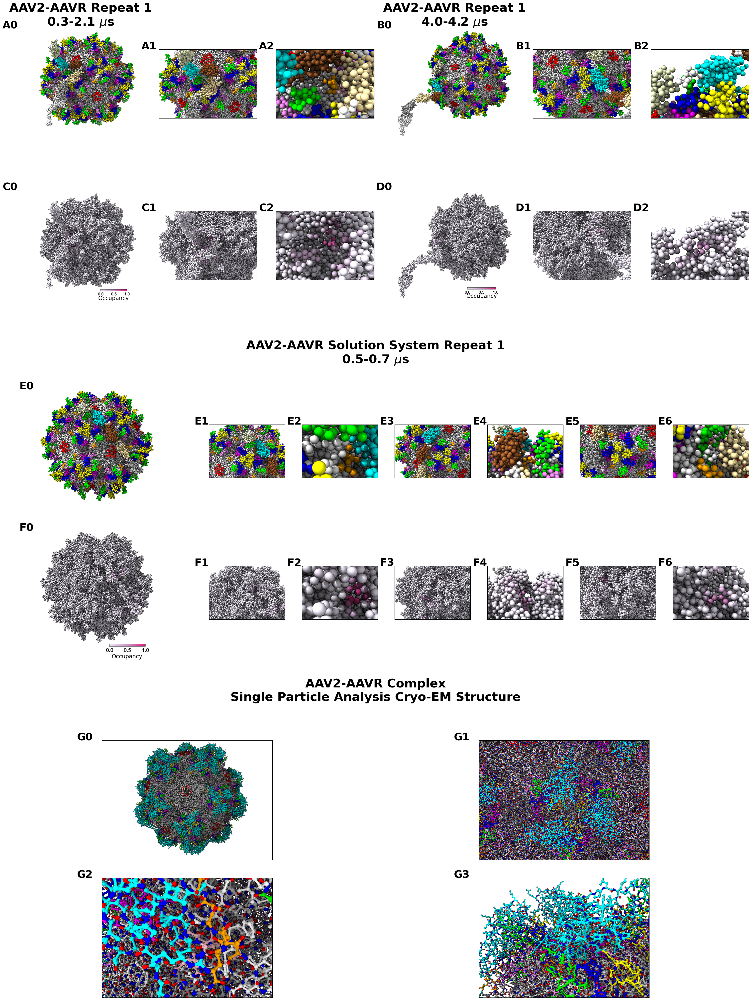

In [156]:
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.cbook as cbook
import matplotlib.cm as cm
from matplotlib.patches import PathPatch
from matplotlib.path import Path
import numpy as np
from aav_lipid_cluster import *
from aav_aavr_interaction import *

titlelab = 35
fig = plt.figure(figsize=(30, 40), layout='compressed')
subfigs = fig.subfigures(3, 1, hspace =0.05)
gs = subfigs[0].add_gridspec(2,8, width_ratios=[0.6,0.6,1,1,0.6,0.6,1,1])
a0 = subfigs[0].add_subplot(gs[0,0:2])
a1 = subfigs[0].add_subplot(gs[0,2])
a2 = subfigs[0].add_subplot(gs[0,3])
a3 = subfigs[0].add_subplot(gs[0,4:6])
a4 = subfigs[0].add_subplot(gs[0,6])
a5 = subfigs[0].add_subplot(gs[0,7])
a6 = subfigs[0].add_subplot(gs[1,0:2])
a7 = subfigs[0].add_subplot(gs[1,2])
a8 = subfigs[0].add_subplot(gs[1,3])
a9 = subfigs[0].add_subplot(gs[1,4:6])
a10 = subfigs[0].add_subplot(gs[1,6])
a11 = subfigs[0].add_subplot(gs[1,7])
sf0 = [a0, a1, a2, a3, a4, a5, a6, a7, a8, a9, a10, a11]
for i in range(len(sf0)):
    with cbook.get_sample_data(subfig0[i]) as image_file:
        image = plt.imread(image_file)
    sf0[i].imshow(image, resample=True)
    sf0[i].set_yticks([])
    sf0[i].set_xticks([])
b = subfigs[1].subplots(2,7, width_ratios=[2.5,1,1,1,1,1,1])
b=b.flat
for i in range(len(b)):
    with cbook.get_sample_data(subfig1[i]) as image_file:
        image = plt.imread(image_file)
    b[i].imshow(image, resample=True)
    b[i].set_yticks([])
    b[i].set_xticks([])
c = subfigs[2].subplots(2,2)
c = c.flat
for i in range(len(c)):
    with cbook.get_sample_data(subfig2[i]) as image_file:
        image = plt.imread(image_file)
    c[i].imshow(image, resample=True)
    c[i].set_yticks([])
    c[i].set_xticks([])
sf0l = ['A0', 'A1', 'A2', 'B0', 'B1', 'B2', 'C0', 'C1', 'C2', 'D0', 'D1', 'D2']
for k in range(len(sf0)):
    sf0[k].annotate(sf0l[k], fontsize=30, fontweight = 'bold',
                xy = (-0.1,1), xytext=(0,0),
                xycoords='axes fraction', textcoords = 'offset points',
                ha = 'center', va = 'baseline')
sf1l = ['E0', 'E1', 'E2', 'E3', 'E4', 'E5', 'E6', 'F0', 'F1', 'F2', 'F3', 'F4', 'F5', 'F6']
for k in range(len(b)):
    b[k].annotate(sf1l[k], fontsize=30, fontweight = 'bold',
                xy = (-0.1,1), xytext=(0,0),
                xycoords='axes fraction', textcoords = 'offset points',
                ha = 'center', va = 'baseline')
sf2l = ['G0', 'G1', "G2", 'G3']
for k in range(len(c)):
    c[k].annotate(sf2l[k], fontsize=30, fontweight = 'bold',
                xy = (-0.1,1), xytext=(0,0),
                xycoords='axes fraction', textcoords = 'offset points',
                ha = 'center', va = 'baseline')
sf0[0].set_title("AAV2-AAVR Repeat 1\n0.3-2.1 $\mu$s", fontsize=titlelab, fontweight='bold')
sf0[3].set_title("AAV2-AAVR Repeat 1\n4.0-4.2 $\mu$s", fontsize=titlelab, fontweight='bold')
subfigs[1].suptitle("AAV2-AAVR Solution System Repeat 1\n0.5-0.7 $\mu$s\n", fontsize=titlelab, fontweight='bold')
subfigs[2].suptitle("AAV2-AAVR Complex\nSingle Particle Analysis Cryo-EM Structure\n\n", fontsize=titlelab, fontweight='bold')

#####
sf0[0].set_xlim(225,1625)
sf0[3].set_xlim(225,1625)
sf0[6].set_xlim(225,1625)
sf0[9].set_xlim(225,1625)
b[0].set_xlim(400,1500)
b[7].set_xlim(400,1500)
b[0].set_ylim(1300,150)
b[7].set_ylim(1300,150)
#####
#####
sf0[0].axis('off')
sf0[3].axis('off')
sf0[6].axis('off')
sf0[9].axis('off')
sf0[6].annotate("Occupancy", fontsize=16, xy=(0.78,0.005), xycoords='axes fraction', ha='center', va='baseline')
sf0[9].annotate("Occupancy", fontsize=16, xy=(0.73,0.025), xycoords='axes fraction', ha='center', va='baseline')
b[0].axis('off')
b[7].axis('off')
b[7].annotate("Occupancy", fontsize=16, xy=(0.75,-0.03), xycoords='axes fraction', ha='center', va='baseline')
#####
plt.savefig("fig6/fig6_unlabeled.svg", dpi=600)

# SI_FIG AAV2-AAVR Repeat1

In [ ]:
# Capsid-AAVR protein-protein interactions Repeat 3
import MDAnalysis as mda
import sys
sys.path.append("../") # go to parent dir
import aav_lipid_cluster
import aav_aavr_interaction
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

# Capsid-AAVR protein-protein interactions

u = mda.Universe('/Users/pp420/mres_aav_aavr_project/aav2_aavr_scaled_3/dir_v2r1/v2r1_nosolv.gro', 
                 '/Users/pp420/mres_aav_aavr_project/aav2_aavr_scaled_3/dir_v2r1/v2r1_nosolv.xtc')
capsid_bb = aav_aavr_interaction.assemble_timeseries_array(u=u, selection = "name BB and resid 1:31020")
aavr_3_bb = aav_aavr_interaction.assemble_timeseries_array(u=u, selection = "name BB and resid 32333:32988")

'''
Interaction between AAV2 capsid and AAVR_2 between 200 and 10000 ns.
Binding Event 1-50
'''

timestamp = np.arange(200,10001,200)

## Compute distances
for j in range(len(timestamp)-1):
    
    s = timestamp[j]
    e = timestamp[j+1]

    capsid_int = capsid_bb[s:e]
    aavr_3_int = aavr_3_bb[s:e]
    time_of_interest = range(s,e)
    binding_event = np.empty((len(time_of_interest),len(capsid_int[0]),len(aavr_3_int[0])), dtype=np.float32)

    for i in range(len(time_of_interest)):
        mat = aav_aavr_interaction.numba_cdist(residues_1=capsid_int[i],residues_2=aavr_3_int[i])
        binding_event[i] += mat

    binding_event = binding_event < 10
    binding_event_capsid_occupancy = binding_event.sum(axis=2) > 0 
    binding_event_capsid_occupancy  = binding_event_capsid_occupancy.sum(axis=0) / len(binding_event)
    binding_event_aavr3_occupancy = binding_event.sum(axis=1) > 0 
    binding_event_aavr3_occupancy  = binding_event_aavr3_occupancy.sum(axis=0) / len(binding_event)

    be_ndx = j + 1
    aavr_ndx = 3

    np.save(f"rep1_binding_events/be{be_ndx}_cap", binding_event_capsid_occupancy)
    np.save(f"rep1_binding_events/be{be_ndx}_aavr{aavr_ndx}", binding_event_aavr3_occupancy)

    plt.plot(np.arange(1,31021,1), binding_event_capsid_occupancy)
    plt.xlabel("Capsid Residue")
    plt.ylabel(f"AAVR_{aavr_ndx} Occupancy")
    plt.ylim(0,1)
    plt.savefig(f"rep1_binding_events/be{be_ndx}_cap.png",dpi=600)
    plt.clf()

    plt.plot(np.arange(1,657,1), binding_event_aavr3_occupancy)
    plt.xlabel(f"AAVR_{aavr_ndx} Residue")
    plt.ylabel("Capsid Occupancy")
    plt.ylim(0,1)
    plt.axvspan(7,96, zorder=0, alpha=0.2, color="lime", label="PKD1")
    plt.axvspan(103,193, zorder=0, alpha=0.2, color="cyan", label="PKD2")
    plt.axvspan(199,289, zorder=0, alpha=0.2, color="brown", label="PKD3")
    plt.axvspan(295,383, zorder=0, alpha=0.2, color="yellow", label="PKD4")
    plt.axvspan(389,480, zorder=0, alpha=0.2, color="darkgrey", label="PKD5")
    plt.legend()
    plt.savefig(f"rep1_binding_events/be{be_ndx}_aavr{aavr_ndx}.png",dpi=600)
    plt.clf()
    
    del capsid_int
    del aavr_2_int
    del binding_event
    del binding_event_capsid_occupancy
    del binding_event_aavr3_occupancy
    del time_of_interest